# Bitcoin Volatility Prediction_for model

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import missingno as msno
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
import seaborn as sns
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.dates as mdates
from sklearn import linear_model
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import make_scorer, mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score, train_test_split
from pmdarima import auto_arima
from arch import arch_model
import arch
import itertools
import os

# Stationary
import statsmodels.graphics.tsaplots as sgt #ACF, PACF
from statsmodels.tsa.stattools import adfuller #ADF
from statsmodels.tsa.stattools import kpss #KPSS
import warnings #경고 무시

# Interpolation
import pmdarima as pm #auto_arima
from pmdarima.arima.utils import ndiffs
import statsmodels.api as sm

#time
import time

from sklearn.preprocessing import MinMaxScaler # minmax

from sklearn.inspection import permutation_importance # 순열 중요도

In [2]:
## 기본 설정 값

# fig
figsize=(15,5)

# 결과창 출력의 최대 행 및 열 수 설정
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 90)

# 경고 무시 설정
# warnings.filterwarnings('ignore')
# KPSS에서 경고가 하나 떴는데 큰 영향을 미치지 않는다고 하여 작성
# 경고 무시 설정은 다른 코드들 작성할 때 주석 처리해 가며 확인 필요

- 주최측 제공 함수

In [3]:
def convert_tick_to_ohlcv(data):
    """
    Converts given Binance tick data into 1-hour interval OHLCV (Open, High, Low, Close, Volume) data.
    :param data: DataFrame with Tick data
    :return: DataFrame with the Open, High, Low, Close, Volume values
    """

    data['time'] = pd.to_datetime(data['time'], unit='ms')
    ohlcv = data.resample('1H', on='time').agg({
        'price': ['first', 'max', 'min', 'last'],
        'qty': 'sum',
        'price': 'mean',
        'quote_qty': 'std',
        'is_buyer_maker': 'sum'
        
})

    ohlcv.columns = ['Open', 'High', 'Low', 'Close', 'Volume']
    return ohlcv

def calculate_volatility(data, window=20):
    """
    Calculate the rolling volatility using the standard deviation of returns.
    :param data: DataFrame with OHLCV data
    :param window: The number of periods to use for calculating the standard deviation
    :return: DataFrame with the volatility values
    """

    # Calculate daily returns
    data['returns'] = data['Close'].pct_change()

    # Calculate the rolling standard deviation of returns
    data['volatility'] = data['returns'].rolling(window=window).std()

    return data

### Loading Data

In [4]:
df_idc_all = pd.read_csv('BIT_2023_2차.csv')
df_idc_all = df_idc_all.rename(columns={'Unnamed: 0': 'time'})
df_idc_all = df_idc_all.set_index('time')
df_idc_all.index=pd.to_datetime(df_idc_all.index)
dfc=df_idc_all.copy()

In [5]:
df_idc_all.head()

,Open,High,Low,Close,Volume,returns,volatility,price,quote_qty,is_buyer_maker,quote_qty_cal,MACD_613,Signal_Line_4,MACD_Oscillator_613,MACD_1226,Signal_Line_9,MACD_Oscillator_1226,MACD_526,MACD_Oscillator_526,atr_14,atr_20,SO high_202,SO low_202,SO %K_202,SO %D_202,SO high_142,SO low_142,SO %K_142,SO %D_142,SO high_302,SO low_302,SO %K_302,SO %D_302,SO high_203,SO low_203,SO %K_203,SO %D_203,SO high_143,SO low_143,SO %K_143,SO %D_143,SO high_303,SO low_303,SO %K_303,SO %D_303,SO high_205,SO low_205,SO %K_205,SO %D_205,SO high_145,SO low_145,SO %K_145,SO %D_145,SO high_305,SO low_305,SO %K_305,SO %D_305,SO high_2010,SO low_2010,SO %K_2010,SO %D_2010,SO high_1410,SO low_1410,SO %K_1410,SO %D_1410,SO high_3010,SO low_3010,SO %K_3010,SO %D_3010,upper_band_20,lower_band_20,upper_band_15,lower_band_15,upper_band_10,lower_band_10,roc_1,roc_2,rsi_7,rsi_9,rsi_14,UO_71014,UO_7911,UO_71012
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,16537.5,16540.9,16504.0,16527.0,5381.399,-0.000114,0.002974,16524.525741,7264.129209,16494,8.892507e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,36.900,36.900,42951.013121,42089.007951,30.158268,25.972647,42800.998775,42071.423519,34.876807,32.396236,42951.487976,42008.598606,34.716588,31.934377,42951.013121,42089.007951,30.158268,30.256652,42800.998775,42071.423519,34.876807,29.346984,42951.487976,42008.598606,34.716588,35.30988,42951.013121,42089.007951,30.158268,41.405172,42800.998775,42071.423519,34.876807,34.349504,42951.487976,42008.598606,34.716588,44.281694,42951.013121,42089.007951,30.158268,54.022321,42800.998775,42071.423519,34.876807,47.545375,42951.487976,42008.598606,34.716588,57.775868,42827.637739,42237.028473,42879.595561,42249.78458,42885.07396,42180.515812,0.141586,0.093181,100.000000,100.000000,100.000000,0.000000,0.000000,0.000000
2023-01-01 01:00:00,16527.1,16554.3,16524.1,16550.4,3210.826,0.001416,0.002974,16537.215985,6819.889969,8705,5.309812e+07,3.342857,1.337143,2.005714,1.866667,1.213333,1.493333,6.066667,4.853333,33.550,33.550,42951.013121,42089.007951,30.158268,25.972647,42800.998775,42071.423519,34.876807,32.396236,42951.487976,42008.598606,34.716588,31.934377,42951.013121,42089.007951,30.158268,30.256652,42800.998775,42071.423519,34.876807,29.346984,42951.487976,42008.598606,34.716588,35.30988,42951.013121,42089.007951,30.158268,41.405172,42800.998775,42071.423519,34.876807,34.349504,42951.487976,42008.598606,34.716588,44.281694,42951.013121,42089.007951,30.158268,54.022321,42800.998775,42071.423519,34.876807,47.545375,42951.487976,42008.598606,34.716588,57.775868,42827.637739,42237.028473,42879.595561,42249.78458,42885.07396,42180.515812,0.141586,0.093181,100.000000,100.000000,100.000000,40.577816,40.577816,40.577816
2023-01-01 02:00:00,16550.5,16557.1,16534.8,16542.4,2399.668,-0.000483,0.002974,16545.818136,6030.420093,8468,3.970447e+07,4.110204,2.446367,1.663837,2.669706,2.488198,1.837098,7.587654,5.099457,29.800,29.800,42951.013121,42089.007951,30.158268,25.972647,42800.998775,42071.423519,34.876807,32.396236,42951.487976,42008.598606,34.716588,31.934377,42951.013121,42089.007951,30.158268,30.256652,42800.998775,42071.423519,34.876807,29.346984,42951.487976,42008.598606,34.716588,35.30988,42951.013121,42089.007951,30.158268,41.405172,42800.998775,42071.423519,34.876807,34.349504,42951.487976,42008.598606,34.716588,44.281694,42951.013121,42089.007951,30.158268,54.022321,42800.998775,42071.423519,34.876807,47.545375,42951.487976,42008.598606,34.716588,57.775868,42827.637739,42237.028473,42879.595561,42249.78458,42885.07396,42180.515812,-0.048337,0.093181,74.522293,74.522293,74.522293,45.684084,45.684084,45.684084
2023-01-01 03:00:00,16542.5,16542.5,16515.0,16529.3,3214.480,-0.000792,0.002974,16525.582085,7003.352799,10007,5.312115e+07,2.540816,2.484147,0.056669,2.223429,2.979136,1.112657,4.942890,1.963754,29.225,29.225,42951.013121,42089.007951,30.158268,25.972647,42800.998775,42071

### Sloving Caution

In [6]:
# # 경고 해결용(returns ARIMA) - 인덱스에 주파수 정보 추가

# # 기존 데이터프레임의 인덱스를 활용하여 새로운 인덱스 생성
# new_date_rng = pd.date_range(start=df.index.min(), end=df.index.max(), freq='h')

# # 새로운 인덱스를 기존 데이터프레임의 인덱스로 설정
# df = df.reindex(new_date_rng)

#### visualizing - functions

In [7]:
# 시간단위 출력 함수

def Visualizing_returns(dfc, df, start_date, end_date, figsize=(15,5)):
    
    dfc_filtered = dfc.loc[start_date:end_date]
    df_filtered = df.loc[start_date:end_date]
    
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    
    ax[0].plot(dfc_filtered.index, dfc_filtered)
    ax[0].set_ylabel('returns')
    ax[0].set_title(f'{start_date}-{end_date}')
    ax[0].set_xticks([])

    ax[1].plot(df_filtered.index, df_filtered)
    ax[1].set_xlabel('time')
    ax[1].set_ylabel('returns')
    ax[1].set_title(f'{start_date}-{end_date}')
    
    ax[1].xaxis.set_major_locator(mdates.HourLocator())
    ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M:%S'))
    ax[1].tick_params(axis='x', rotation=45)
    
    plt.show()

In [8]:
# 일단위 출력 함수

def Visualizing_returns_d(dfc, df, start_date, end_date, figsize=(15,5)):
    
    df_filtered = df.loc[start_date:end_date]
    dfc_filtered = dfc.loc[start_date:end_date]
    
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    
    ax[0].plot(df_filtered.index, dfc_filtered)
    ax[0].set_ylabel('returns')
    ax[0].set_title(f'{start_date}-{end_date}')
    ax[0].set_xticks([])

    ax[1].plot(df_filtered.index, df_filtered)
    ax[1].set_xlabel('time')
    ax[1].set_ylabel('returns')
    ax[1].set_title(f'{start_date}-{end_date}')
    
    ax[1].xaxis.set_major_locator(mdates.DayLocator())
    ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax[1].tick_params(axis='x', rotation=45)
    
    plt.show()

In [9]:
# spline 보간
def spline_interpolate_column(df, column_name, order=3):
    df[column_name] = df[column_name].interpolate(method='spline', order=order)

#### - ARIMA

In [10]:
# 결측치 보간을 위한 ARIMA 모델 훈련 함수

def interpolate_arima(data, order):
    
    # 결측치 보간 전 ARIMA 모델 훈련
    model = sm.tsa.ARIMA(data.dropna(), order=order)  # p, d, q는 ARIMA 모델의 차수
    results = model.fit()


    # 보간할 결측치 선택
    missing_indices = data[data.isnull()].index

    # 결측치 보간
    for idx in missing_indices:
        # ARIMA 모델을 사용하여 결측치 예측
        predicted_value = results.get_forecast(steps=1).predicted_mean.iloc[0]  # 예측 결과의 첫 번째 값을 사용

        # 결측치 보간
        data[idx] = predicted_value

In [11]:
# # 시계열 데이터에 대한 결측치 보간
# interpolate_arima(df['returns'], (1, 0, 2))

### 데이터 그래프 확인

In [12]:
def Graph(data):
    for i, col in enumerate(data.columns):
        
        plt.figure(figsize=(50, 5))
        plt.plot(data.iloc[:,i])
        plt.title(f'{data.columns[i]}')
        
        # x축에 년도별 간격 표시
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

In [13]:
# Graph(df)

### 2-1. Baseline Model Genarate

In [14]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def rf_base(train_df, test_df, df_name=''): 
    # Train/Test Split
    X_train = train_df.drop('volatility', axis=1)
    y_train = train_df['volatility']
    
    X_test = test_df.drop('volatility', axis=1)
    y_test = test_df['volatility']

    # RandomForestRegressor
    rf_model = RandomForestRegressor(max_depth=15,
                                     max_features=0.2,
                                     n_estimators=400,
                                     random_state=42)  # random_state 추가

    # 모델 학습
    rf_model.fit(X_train, y_train)

    # 예측
    y_pred = rf_model.predict(X_test)

    # 평가지표(MAPE, RMSE)
    test_mape = calculate_mape(y_test, y_pred)
    test_rmse = calculate_rmse(y_test, y_pred)
    print(f'{df_name} : MAPE: {test_mape}, RMSE: {test_rmse}')

- Baseline Model test(테스트용)

In [15]:
# # df 모델링
# df_tr, df_te = train_test_split(df, test_size=0.2, random_state=42)
# rf_base(df_tr, df_te, 'df_tr')

- 손실 곡선

In [16]:
def plot_loss_curve(df_train, df_test, df_name=''):
    # Extracting features and target variable
    X_train = df_train.drop('volatility', axis=1)
    y_train = df_train['volatility']
    
    X_test = df_test.drop('volatility', axis=1)
    y_test = df_test['volatility']

    # Varying n_estimators
    n_estimators_values = [50, 100, 150, 200, 400]
    mape_values = []
    rmse_values = []

    for n_estimators in n_estimators_values:
        # RandomForestRegressor
        rf_model = RandomForestRegressor(n_estimators=n_estimators)

        # 모델 학습
        rf_model.fit(X_train, y_train)

        # 예측
        y_pred = rf_model.predict(X_test)

        # 평가지표(MAPE, RMSE)
        test_mape = calculate_mape(y_test, y_pred)
        test_rmse = calculate_rmse(y_test, y_pred)
        
        mape_values.append(test_mape)
        rmse_values.append(test_rmse)

        print(f'{df_name} - n_estimators={n_estimators}: MAPE: {test_mape}, RMSE: {test_rmse}')

    # Plotting
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))

    ax1.plot(n_estimators_values, mape_values, marker='o', label='MAPE')
    ax1.set_title(f'{df_name} - MAPE vs n_estimators')
    ax1.set_xlabel('n_estimators')
    ax1.set_ylabel('MAPE')
    ax1.legend()

    ax2.plot(n_estimators_values, rmse_values, marker='o', label='RMSE', color='orange')
    ax2.set_title(f'{df_name} - RMSE vs n_estimators')
    ax2.set_xlabel('n_estimators')
    ax2.set_ylabel('RMSE')
    ax2.legend()

    plt.show()


In [17]:
# df_tr, df_te = train_test_split(df, test_size=0.2, random_state=42)
# plot_loss_curve(df_tr, df_te, 'df_tr')

n_estimators 값에 따라 평가지표 값에 유의한 차이가 없음

- grid_kfold

In [18]:
def grid_search_rf(train_df, test_df, param,df_name='', cv=5):
    
    X_train, y_train = train_df.drop('volatility', axis=1), train_df['volatility']
    X_test, y_test = test_df.drop('volatility', axis=1), test_df['volatility']
    
    # 모델 정의
    rf_model = RandomForestRegressor()

    # 그리드 서치 객체 생성
    grid_search = GridSearchCV(estimator=rf_model, param_grid=param, scoring='neg_mean_absolute_error', cv=KFold(n_splits=cv, shuffle=True, random_state=42))

    # 그리드 서치 수행
    grid_search.fit(X_train, y_train)

    # 최적의 하이퍼파라미터
    best_params = grid_search.best_params_
    print(f"Best Parameters: {best_params}")

    # 최적 모델 추출
    best_rf_model = grid_search.best_estimator_

    # 최적 모델로 예측
    y_pred = best_rf_model.predict(X_test)

    # 최적 모델 평가
    test_mape = calculate_mape(y_test, y_pred)
    test_rmse = calculate_rmse(y_test, y_pred)
    print(f'{df_name} MAPE: {test_mape}, RMSE: {test_rmse}')

    return best_rf_model


- 1차_하이퍼파라미터 튜닝_베이스라인 모델 파라미터 지정

In [19]:
# %time
# param = {
#     'n_estimators': [50, 100, 150, 200, 400],
#     'max_depth': [5, 10, 15, 20],
#     'max_features': [0.2, 0.4, 0.7, 0.8, 0.9, 1.0]
# }


# best_model = grid_search_rf(df_tr, df_te, param, df_name='df_tr')

In [20]:
# diff data Modeling
# df_diff_tr, df_diff_te = train_test_split(df_diff, test_size=0.2, random_state=42)
# rf_base(df_diff_tr, df_diff_te, 'df_diff_tr')

### 2-3. Technical Indicators

#### MACD Function (Moving Average Convergence Divergence)
Calculates the difference between short-term and long-term moving averages to indicate trends.
Quickly detects trends but may be sensitive to noise.
#### Stochastic Oscillator Function
An indicator that reflects the trend of price fluctuations in financial markets such as stocks.
Calculates the relative strength of the price based on the highest (High) and lowest (Low) prices over the last N days.
#### ATR Function (Average True Range)
An indicator that represents the average range of price movements.
Calculates volatility using True Range.
#### Bollinger Bands Function
An indicator that uses moving averages and standard deviation to assess the relative height of prices.
Forms upper and lower bands around the moving average, indicating deviations in stock prices.
#### ROC Function (Rate of Change)
Measures the relative price change over a certain period.
Analyzes the flow of stock prices by comparing the current price with the price a certain period ago.
#### RSI Function (Relative Strength Index)
Relative Strength Index indicating the relative strength of price movements over a specific period.
Generally, values above 70 indicate an uptrend, while values below 30 indicate a downtrend.
#### Ultimate Oscillator Function
A comprehensive indicator that combines relative strength for various periods.
Provides a richer analysis of the stock price trend.

###  2-3-1. Technical Indicators - functions

### 2-3-2. Technical Indicators - Optimization

1. 결측치
2. 평가지표 비교
* 수익률: 볼린저 밴드를 기반으로 한 수익률을 평가하는 지표로, 해당 지표가 가격의 특이값을 얼마나 잘 캐치하고 이에 따른 수익을 얼마나 창출하는지를 측정.
* 변동성: 볼린저 밴드를 기반으로 주가의 변동성을 얼마나 잘 포착하는지를 확인하는 지표
* 최대 손실: 볼린저 밴드를 기반으로 투자 전략이 어떤 상황에서 최대 손실을 겪는지 확인하는 지표
* 승률: 볼린저 밴드의 신호가 실제로 가격의 특이값을 잘 나타내고 있는지 확인하는 지표로, 해당 기준은 상한선('upper_band')를 넘는 경우를 '승리'로 간주.

##### Stochastic Oscillator
일반적으로는 14와 3을 사용한다. 
- period의 경우, 주가 데이터의 기간에 따라 최적의 값을 설정할 수 있다. 예를 들어, 10일, 30일, 50일 등 다양한 기간을 선택할 수 있다.
- m은 %K의 이동평균을 계산하는데 사용되는 기간이다. 따라서, 2, 5, 10 등 다른 값을 설정할 수도 있다.
> 주가 데이터의 특성과 분석 목적에 따라 period와 m의 값을 조정하여 최적의 결과를 얻을 수 있다

##### Boolinger Band
일반적으로 20일과 2배수를 사용

* window 값 설정은 주가의 변동을 얼마나 민감하게 볼 것인가에 따라 결정함

  기본값 : 20일이며, 10일~50일 사이의 값

  작은 값으로 설정 시 짧은 주기 동안의 가격 움직임을 빠르게 파악할 수 있고, 큰 값 설정 시 긴 주기의 추세를 부드럽게 나타낼 수 있습니다.

* 표준편차 배수 설정은 주가의 움직임을 어느 폭까지 감지할 것인가에 따라 결정할 수 있습니다.

  기본값은 2이고, 1.5 또는 2 값이 적절합니다.

  작은 값 설정 시 움직임을 파악하는 폭이 좁아져서 특이한 움직임이나 극단적인 상황을 감지하기 어렵고, 큰 값 설정 시 큰 변동성을 감지하기 용이합니다.

> **표준편차 배수 : 1.5와 2 확인 필요.**

> **window 값 : 짧은 주기 설정이 필요하다는 판단 하에 10일, 15일, 20일 경우 확인.**

> window 값이 10이고 표준편차 배수가 1.5일 때 가장 적음

### 2-3-3. Technical Indicators - Generation

In [21]:
df_idc_all.shape

(8760, 83)

### 2-3-4. Checking Missing Value

In [22]:
df_idc_all.isna().sum()

Open                    0
High                    0
Low                     0
Close                   0
Volume                  0
returns                 0
volatility              0
price                   0
quote_qty               0
is_buyer_maker          0
quote_qty_cal           0
MACD_613                0
Signal_Line_4           0
MACD_Oscillator_613     0
MACD_1226               0
Signal_Line_9           0
MACD_Oscillator_1226    0
MACD_526                0
MACD_Oscillator_526     0
atr_14                  0
atr_20                  0
SO high_202             0
SO low_202              0
SO %K_202               0
SO %D_202               0
SO high_142             0
SO low_142              0
SO %K_142               0
SO %D_142               0
SO high_302             0
SO low_302              0
SO %K_302               0
SO %D_302               0
SO high_203             0
SO low_203              0
SO %K_203               0
SO %D_203               0
SO high_143             0
SO low_143  

## 2-4. Feature Engineering

In [23]:
# 함수 구현을 위해 데이터 필요
# df_idc_all은 결측치가 존재하므로 
# df와 'is_buyer_maker'컬럼으로 임시 진행

### 2-4-1. Scailing

In [24]:
def MinMax(df):
    
    scaler= MinMaxScaler()
    scaled_data=scaler.fit_transform(df)
    scaled_data=pd.DataFrame(scaled_data, columns=['Open', 'High', 'Low', 'Close', 'Volume', 'returns', 'volatility',
       'price', 'quote_qty', 'is_buyer_maker', 'quote_qty_cal'], index=df.index)
    
    return scaled_data

In [25]:
#df_mm=MinMax(df)

### 2-4-2. Feature Engineering - functions

In [26]:
# Correlation, Scatter

def scatter_plot(df, y_col='volatility', title="Scatter Plot"):
    # 상관계수
    correlations = df.corr()[y_col]
    print(correlations)
      
#     sns.set(style="ticks")
#     sns.pairplot(df)

    num_cols = len(df.columns) - 1  # 종속 변수를 제외한 변수의 개수
    num_rows = int(np.ceil(num_cols / 3))  # 그리드의 행 수 (3개씩 나열)
    
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows*5))
    axes = axes.flatten()

    for i, col in enumerate(df.columns):
        if col != y_col:
            sns.scatterplot(x=col, y=y_col, data=df, alpha=0.7, ax=axes[i])
            axes[i].set_title(f'Scatter Plot between {y_col} and {col}')
            axes[i].set_xlabel(col)
            axes[i].set_ylabel(y_col)

    plt.tight_layout()
    plt.show()

In [27]:
# Feature Importance, Permutation Importance, Heatmap

def FI_PI_HM(df, df_name, figsize, threshold=0.2):
    # Train/Test Split
    X_train = df.drop('volatility', axis=1)
    y_train = df['volatility']

    # RandomForestRegressor
    rf_model = RandomForestRegressor(max_depth=15,
                                     max_features=0.2,
                                     n_estimators=400,
                                     random_state=42)  # random_state 추가
    # 모델 학습
    rf_model.fit(X_train, y_train)
    
    
    # Feature Importances
    feature_importances = rf_model.feature_importances_
    feature_names = X_train.columns
    # 중요도 순으로 정렬
    indices = np.argsort(feature_importances)[::-1]
    # 시각화
    plt.figure(figsize=figsize)
    plt.bar(range(X_train.shape[1]), feature_importances[indices])
    plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
    plt.title('Feature Importances')
    plt.show()

    
    # Permutation Importance
    perm_importance = permutation_importance(rf_model, X_train, y_train, n_repeats=30, random_state=42)
    perm_importance_df = pd.DataFrame({'Variable': X_train.columns, 'Importance': perm_importance.importances_mean})
    perm_importance_df.sort_values(by='Importance', ascending=False, inplace=True)
    # 시각화
    plt.figure(figsize=figsize)
    plt.barh(perm_importance_df['Variable'], perm_importance_df['Importance'], color='skyblue')
    plt.xlabel('Permutation Importance')
    plt.title('Permutation Importance for each Variable')
    plt.show()
    
    
    # Heatmap
    correlations = df.corr()['volatility']
    # 정렬
    sorted_correlations = correlations.abs().sort_values(ascending=False)
    # heatmap
    plt.figure(figsize=figsize)
    # Filter
    significant_correlations = sorted_correlations[sorted_correlations >= threshold]
    sns.heatmap(df[significant_correlations.index].corr(), annot=True, cmap='coolwarm', cbar_kws={'label': 'Correlation'}, fmt=".2f", linewidths=.5)
    plt.title(f'Correlation Heatmap with {y_train} (Correlation Threshold = {threshold})')
    plt.show()

In [28]:
def calculate_importance(train_df, test_df, df_name=''): 
    # Train/Test Split
    X_train = train_df.drop('volatility', axis=1)
    y_train = train_df['volatility']
    
    X_test = test_df.drop('volatility', axis=1)
    y_test = test_df['volatility']

    # RandomForestRegressor
    rf_model = RandomForestRegressor(max_depth=15,
                                     max_features=0.2,
                                     n_estimators=400,
                                     random_state=42)  # random_state 추가

    # 모델 학습
    rf_model.fit(X_train, y_train)

    # 예측
    y_pred = rf_model.predict(X_test)

    # Feature Importances 시각화
    feature_importances = rf_model.feature_importances_
    feature_names = X_train.columns

    # 중요도 순으로 정렬
    indices = np.argsort(feature_importances)[::-1]

    # 시각화
    plt.figure(figsize=(12, 6))
    plt.bar(range(X_train.shape[1]), feature_importances[indices])
    plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
    plt.title('Feature Importances')
    plt.show()
    
    
    # Permotion Importance
    perm_importance = permutation_importance(rf_model, X_train, y_train, n_repeats=30, random_state=42)
    perm_importance_df = pd.DataFrame({'Variable': X_train.columns, 'Importance': perm_importance.importances_mean})
    perm_importance_df.sort_values(by='Importance', ascending=False, inplace=True)

    # 시각화
    plt.figure(figsize=(10, 6))
    plt.barh(perm_importance_df['Variable'], perm_importance_df['Importance'], color='skyblue')
    plt.xlabel('Permutation Importance')
    plt.title('Permutation Importance for each Variable')
    plt.show()

In [29]:
# Heatmap

def plot_correlation_heatmap(df, y_col='volatility', threshold=0.2, figsize=(12, 8)):
    correlations = df.corr()[y_col]
    
    # 정렬
    sorted_correlations = correlations.abs().sort_values(ascending=False)

    # heatmap
    plt.figure(figsize=figsize)
    
    # Filter
    significant_correlations = sorted_correlations[sorted_correlations >= threshold]

    sns.heatmap(df[significant_correlations.index].corr(), annot=True, cmap='coolwarm', cbar_kws={'label': 'Correlation'}, fmt=".2f", linewidths=.5)
    
    plt.title(f'Correlation Heatmap with {y_col} (Correlation Threshold = {threshold})')
    plt.show()


### 2-4-2. Feature Engineering - Test

df_tr : MAPE: 41.25415007497947, RMSE: 0.0018482293608570292

In [30]:
# df_tr, df_te = train_test_split(df, test_size=0.2, random_state=42)
# rf_base(df_tr, df_te, 'df_tr')

Open                   -0.004850
High                    0.000956
Low                    -0.010818
Close                  -0.004508
Volume                  0.392901
returns                 0.023663
volatility              1.000000
price                  -0.004824
quote_qty               0.117234
is_buyer_maker          0.425192
quote_qty_cal           0.385466
MACD_613                0.142506
Signal_Line_4           0.165970
MACD_Oscillator_613    -0.068306
MACD_1226               0.242920
Signal_Line_9           0.247922
MACD_Oscillator_1226   -0.048654
MACD_526                0.203318
MACD_Oscillator_526    -0.067442
atr_14                  0.745621
atr_20                  0.772011
SO high_202             0.027261
SO low_202             -0.058170
SO %K_202               0.049764
SO %D_202               0.054686
SO high_142             0.021967
SO low_142             -0.045806
SO %K_142               0.037235
SO %D_142               0.042593
SO high_302             0.022279
SO low_302

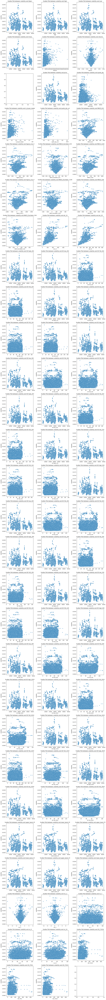

In [31]:
#scatter_plot(df_idc_all, y_col='volatility', title="Scatter Plot")

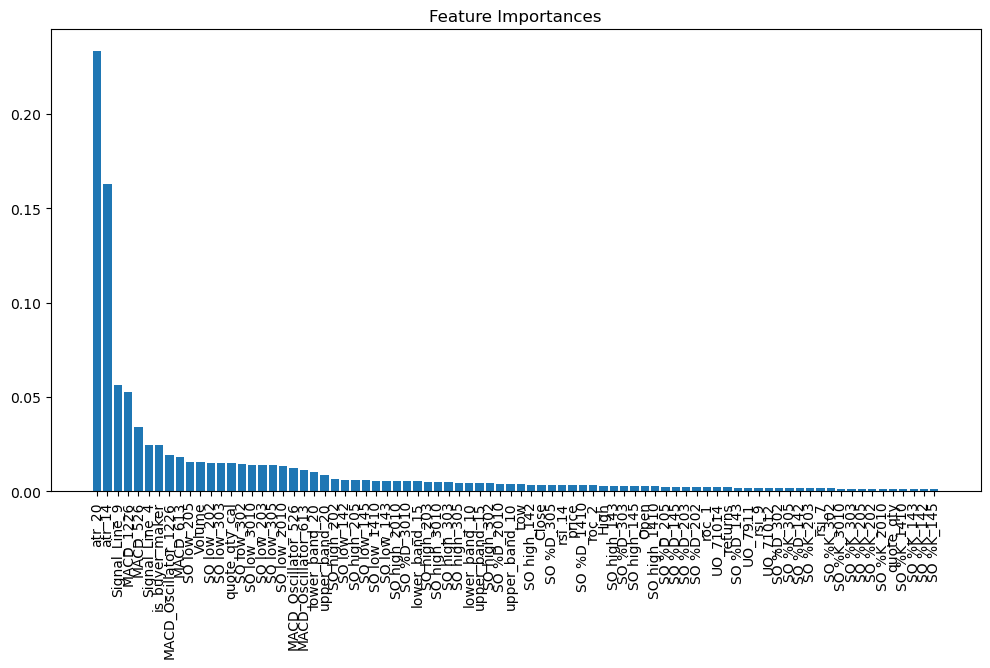

In [ ]:
df_idc_tr, df_idc_te = train_test_split(df_idc_all, test_size=0.2, random_state=42)
#calculate_importance(df_idc_tr, df_idc_te, df_name='df')

In [ ]:
#FI_PI_HM(df_mm,'df_mm', figsize=(12, 6), threshold=0.2)

## 3. Model Evaluation

## 4. Model Efficiency Optimization

- kfold